In [ ]:
import tensorflow as tf

import os
import numpy as np
import matplotlib.pyplot as plt
import statistics
import pickle

import math
import cv2
import numpy as np
from numpy import cos as cos
from numpy import sin as sin
from numpy import sqrt as sqrt
from numpy import arctan2 as arctan2
import os
import datetime
import time

import sys
sys.path.append('/content/drive/My Drive/Colab Notebooks/common')
print(sys.path)
from functions import *
from tf_functions import *
from zernike_functions import *

['', '/content', '/env/python', '/usr/lib/python37.zip', '/usr/lib/python3.7', '/usr/lib/python3.7/lib-dynload', '/usr/local/lib/python3.7/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.7/dist-packages/IPython/extensions', '/root/.ipython', '/content/drive/My Drive/Colab Notebooks/common']


In [ ]:
def init_param():
    ### N: pix num, p: pix size[m]
    N = 2160
    p = 3.74e-6

    ### l_ambda: wavelength
    l_ambda = 520e-9

    ### z: distance from aperture to screen
    z = 0.02

    ### pupil_r: pupil radius, pupil_r_m: (m)
    pupil_r_m = N*p/2
    pupil_r_mm = pupil_r_m*1000

    ### focus length of lens
    lens_f = 0.02

    ##### Zernike Efficients Setting #####
    nm_arr = [[2,0], [3,1]]
    nm_coeff_arr = [0.0, 0.0]

    return N, z, p, l_ambda, pupil_r_m, pupil_r_mm, lens_f, nm_arr, nm_coeff_arr

In [ ]:
# gpu_id = 0
# print(tf.__version__)
# if tf.__version__ >= "2.1.0":
#     physical_devices = tf.config.list_physical_devices('GPU')
#     tf.config.list_physical_devices('GPU')
#     tf.config.set_visible_devices(physical_devices[gpu_id], 'GPU')
#     tf.config.experimental.set_memory_growth(physical_devices[gpu_id], True)
#     print('set gpu_id')

False
0.05810233846153847
743.5156853212845


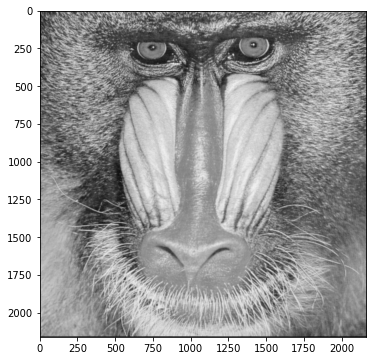

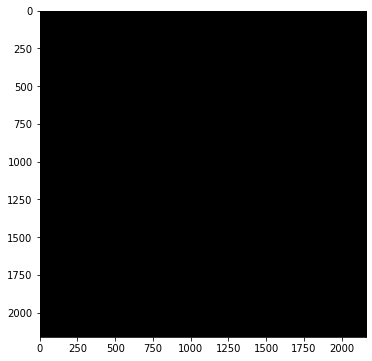

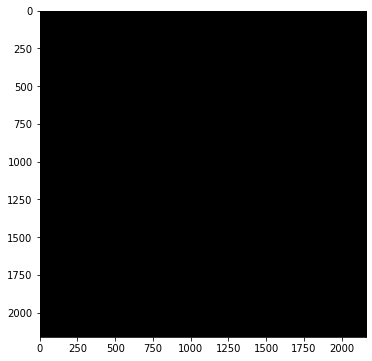

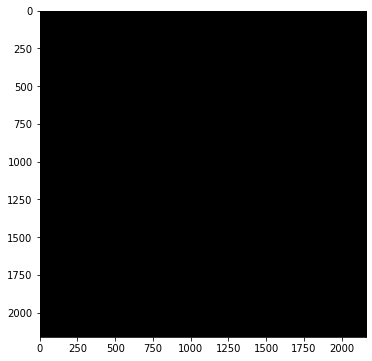

In [ ]:
##### Initialization #####
### Initial Params
N, z, p, l_ambda, pupil_r_m, pupil_r_mm, lens_f, nm_arr, nm_coeff_arr = init_param()
back_z = z * -1.0
k = 2*np.pi/l_ambda

### Pupil Function(ふつうの)
#p_xy = CGH.pupil_func(N, p, pupil_r_m)
p_xy = CGH.big_pupil_func(N)

### Wavefront Aberration
W_xy = np.zeros((N, N))

for i in range(len(nm_arr)):
    nm = nm_arr[i]
    nm_coeff = nm_coeff_arr[i]
    temp_W_xy = CGH.norm_wave_aberration(N, nm)
    temp_W_xy = CGH.resize_and_add_pad(temp_W_xy, N, p, pupil_r_m)
    W_xy += temp_W_xy * nm_coeff

# W_xy = W_xy * 0.5
# W_xy = W_xy * 2.0

### Reverse Wavefront Aberration
rev_W_xy = W_xy * -1.0

### Generalized Pupil Function
P_xy = CGH.general_pupil(p_xy, W_xy, l_ambda)
rev_P_xy = CGH.general_pupil(p_xy, rev_W_xy, l_ambda)

###

### Directory and Path for Save
dir_fn = ''
fn = ''
out_path = PreProcess.mkdir_out_dir(dir_fn, fn, N, p, z)


##### Check Aliasing #####
CGH.check_aliasing(lens_f, N, l_ambda, p, z)


##### Input Image #####
in_dir = '../input/'
#in_dir = 'drive/My Drive/Colab Notebooks/input/'
amp_img_np = cv2.imread(in_dir + 'baboon_gray.png', cv2.IMREAD_GRAYSCALE)
# amp_img_np = cv2.imread(in_dir + 'peppers_gray.png', cv2.IMREAD_GRAYSCALE)
# amp_img_np = cv2.imread(in_dir + 'USAF_1951.png', cv2.IMREAD_GRAYSCALE)
size = (N, N)
half_size =(N//2, N//2)
amp_img_np = cv2.resize(amp_img_np, size)
#amp_img_np = cv2.resize(amp_img_np, half_size)
#amp_img_np = ImageProcess.add_zero_padding(amp_img_np)
cv2.imwrite('drive/My Drive/Colab Notebooks/input/resized.png', amp_img_np)
amp_img_np = amp_img_np / 255.0
amp_img = tf.constant(amp_img_np)
amp_img = tf.dtypes.cast(amp_img, tf.float64)


##### Initial Random Phase #####
# phase = np.random.uniform(-np.pi, np.pi, size)
random_phase = np.random.uniform(0.0, 2.0*np.pi, size)
init_phase = tf.constant(random_phase)
phase = tf.Variable(random_phase)


##### Incident Light toward SLM #####
light_img = tf.fill(size, 1.0)
light_img = tf.dtypes.cast(light_img, tf.complex128)


##### Target Image #####
source_amp = np.sqrt(amp_img)
source_img = source_amp

# When using Intensity Distribution
goal_img = amp_img
goal_img_tf = tf.constant(goal_img)
goal_img_tf = tf.dtypes.cast(goal_img_tf, tf.complex128)

target = amp_img

abe_imgs = [
    amp_img_np,
    CGH.amp_abs(CGH.intensity(P_xy)),
    CGH.amp_abs(CGH.amplitude(P_xy)),
    CGH.phase_norm(CGH.phase(P_xy)),]
ImageProcess.show_imgs(abe_imgs)

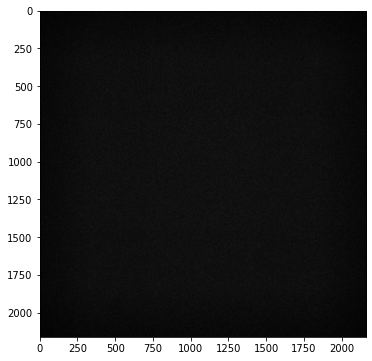

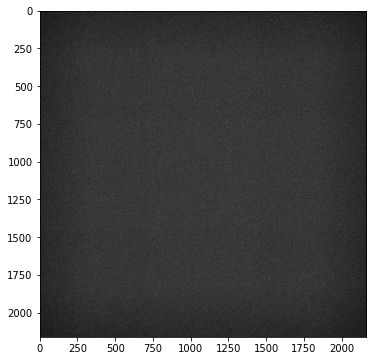

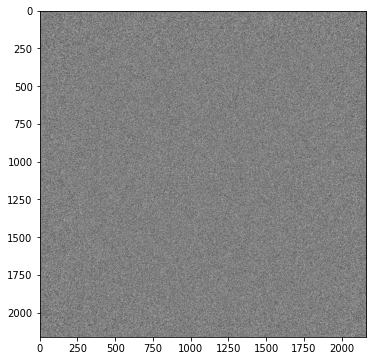

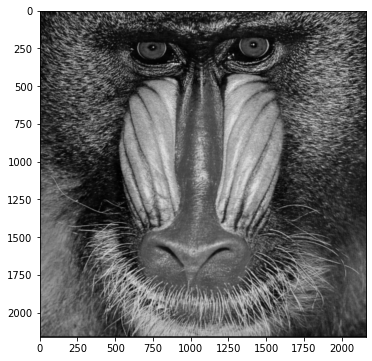

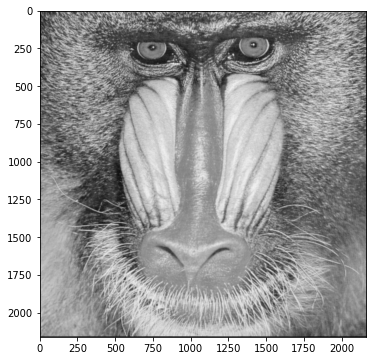

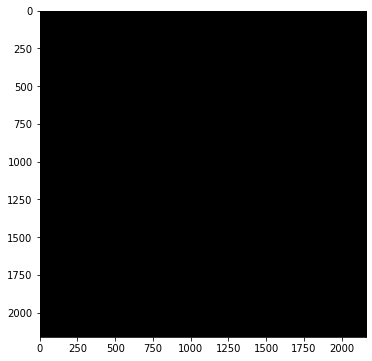

PSNR:  6.585819677279769
tf.Tensor(0.10974583232965975, shape=(), dtype=float64)


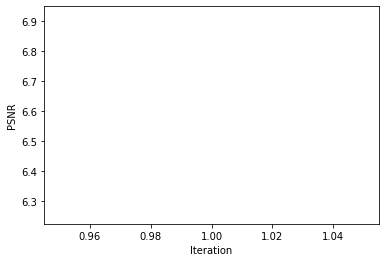

1


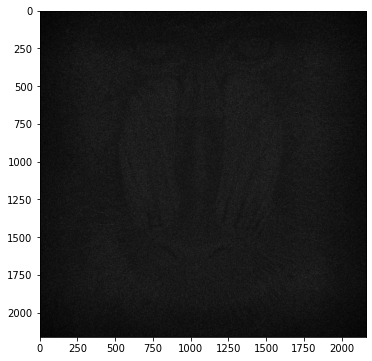

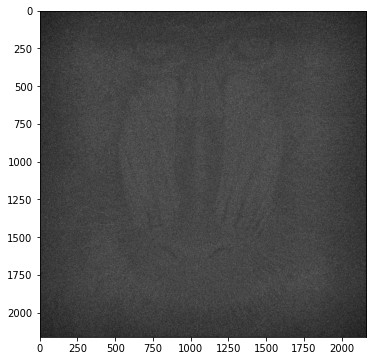

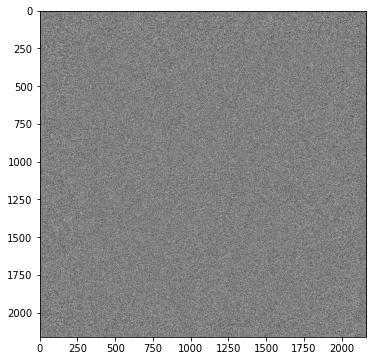

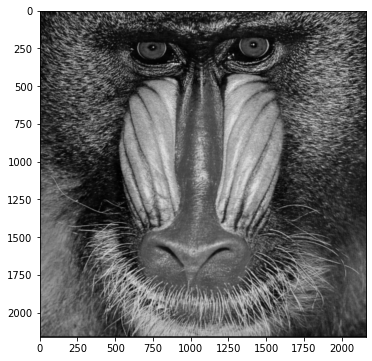

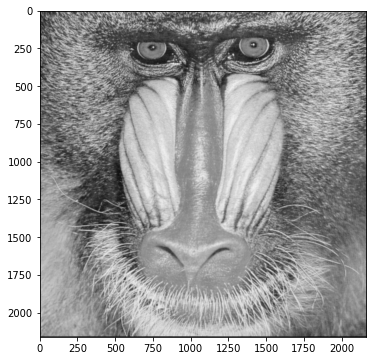

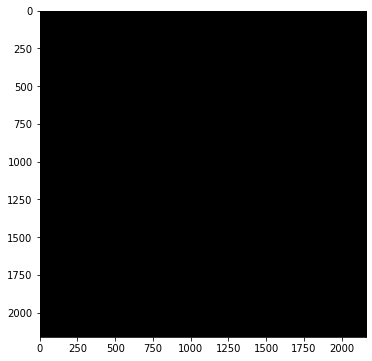

PSNR:  7.141544892194943
tf.Tensor(0.09656405953158721, shape=(), dtype=float64)


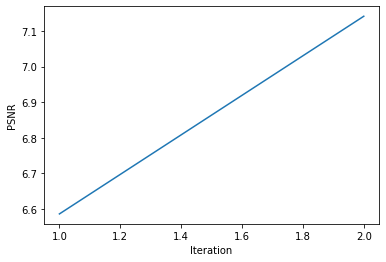

2


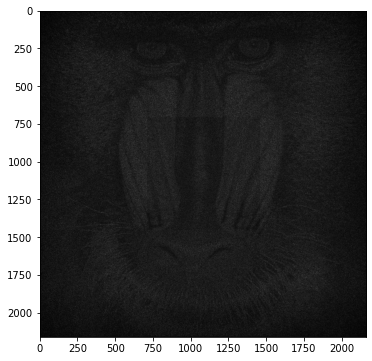

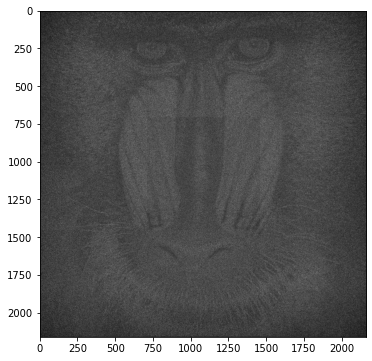

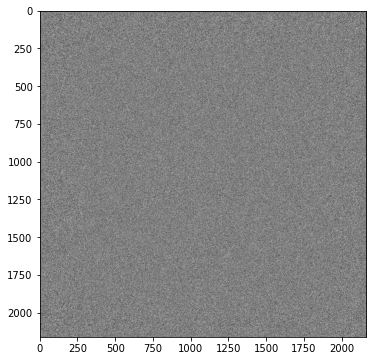

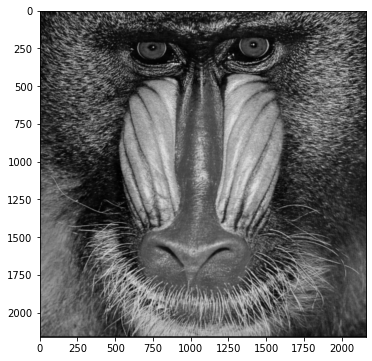

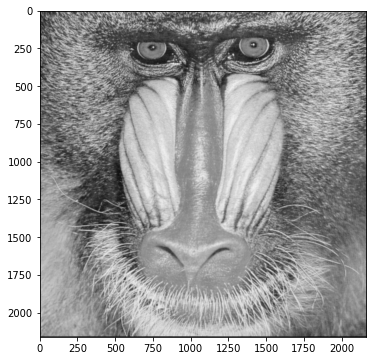

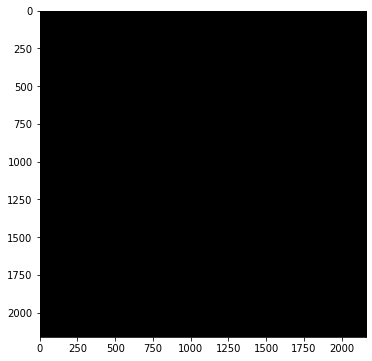

PSNR:  7.382917478437573
tf.Tensor(0.09134362789587724, shape=(), dtype=float64)


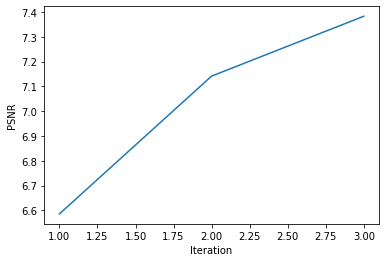

3


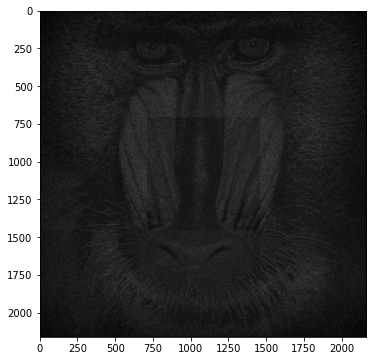

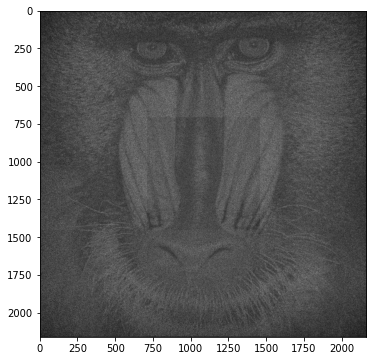

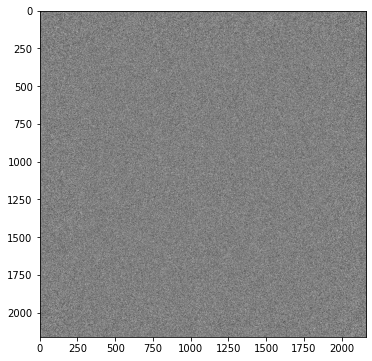

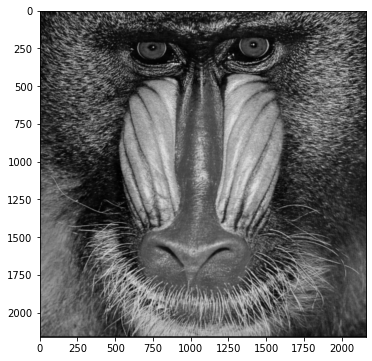

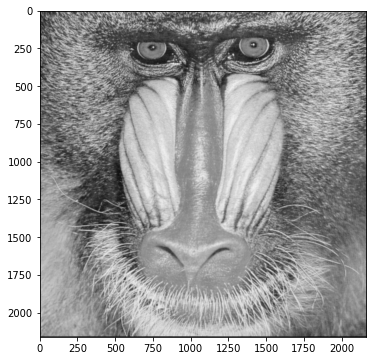

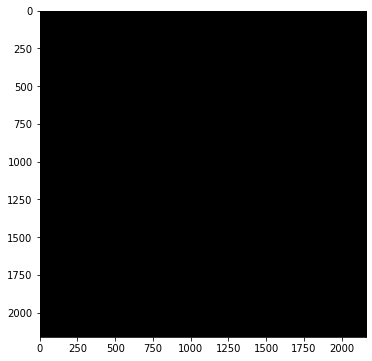

PSNR:  7.660306706701721
tf.Tensor(0.0856918134492234, shape=(), dtype=float64)


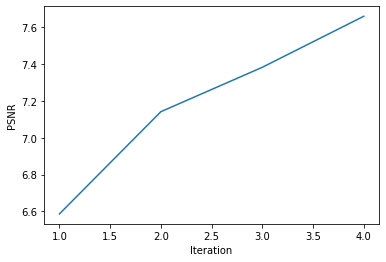

4


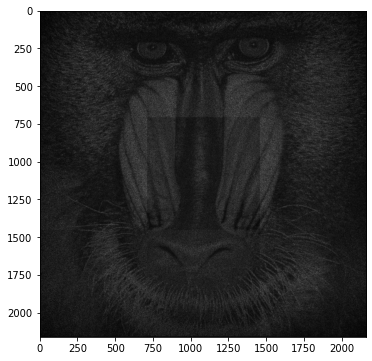

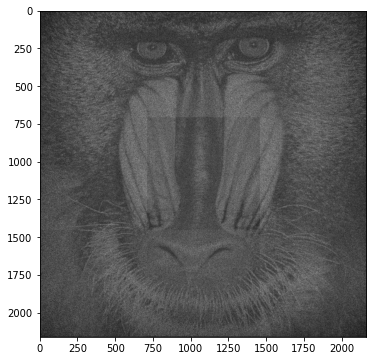

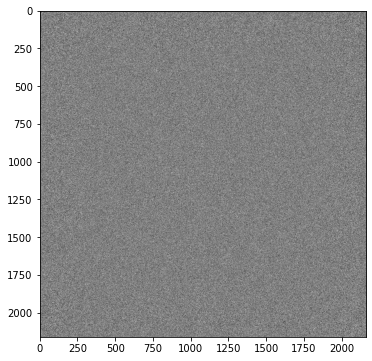

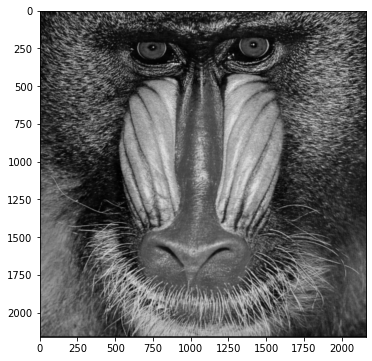

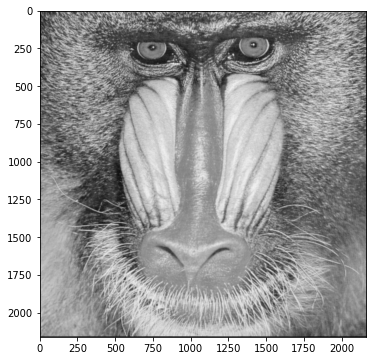

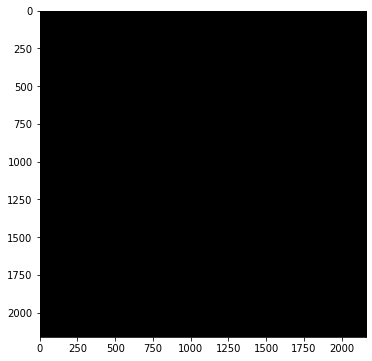

PSNR:  7.936134308788408
tf.Tensor(0.0804186120762949, shape=(), dtype=float64)


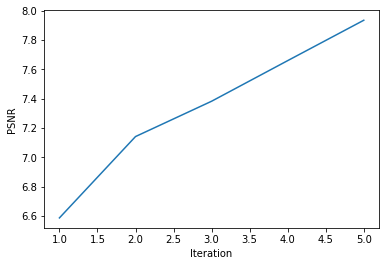

5


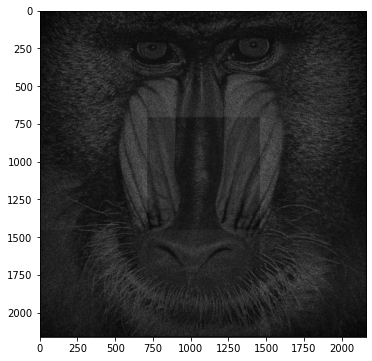

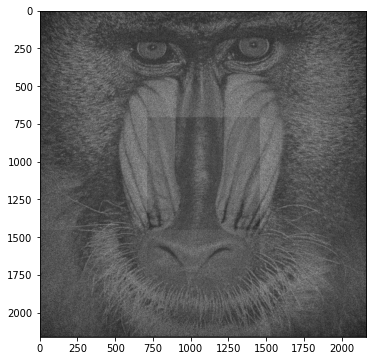

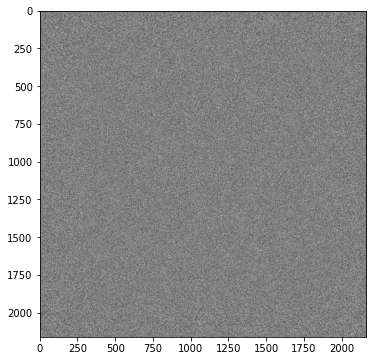

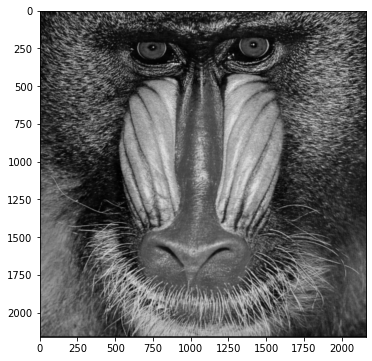

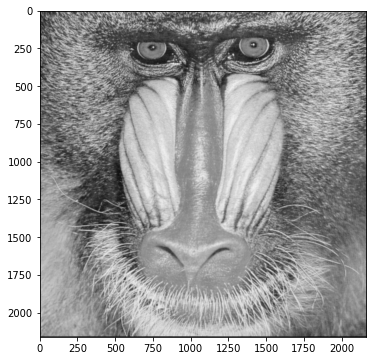

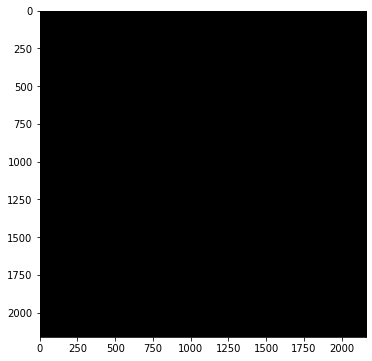

PSNR:  8.263258901666733
tf.Tensor(0.07458373260005888, shape=(), dtype=float64)


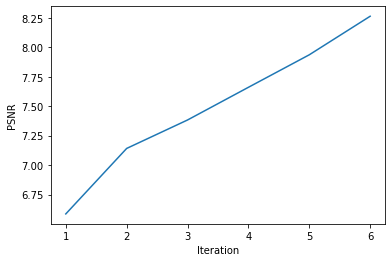

6


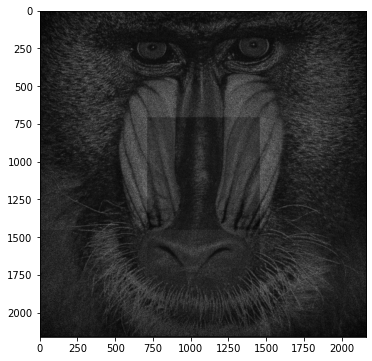

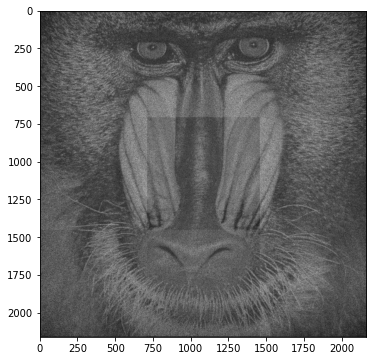

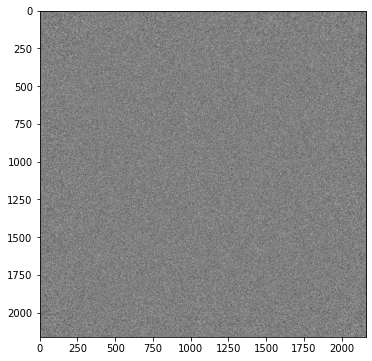

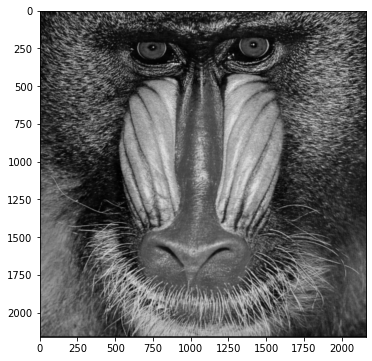

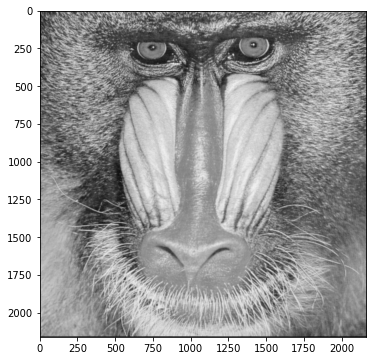

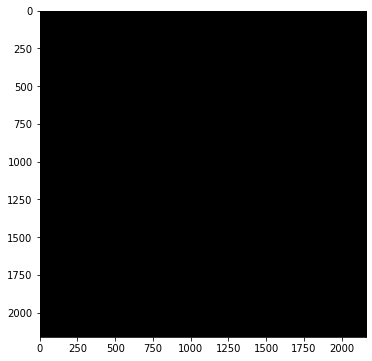

PSNR:  8.6249129576854
tf.Tensor(0.06862442342331955, shape=(), dtype=float64)


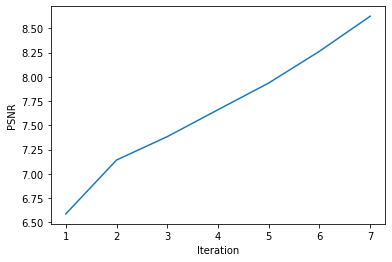

7


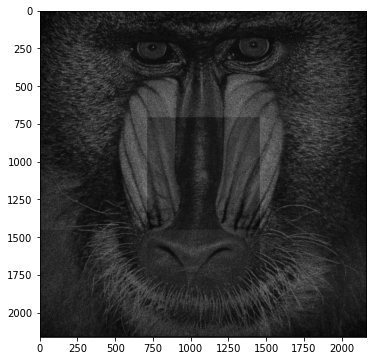

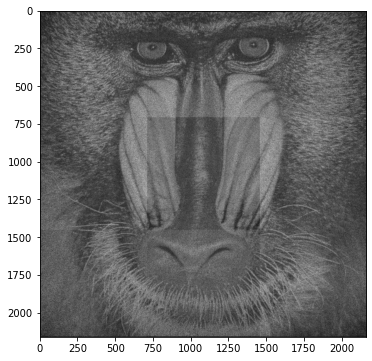

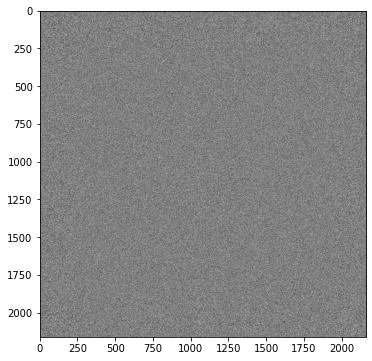

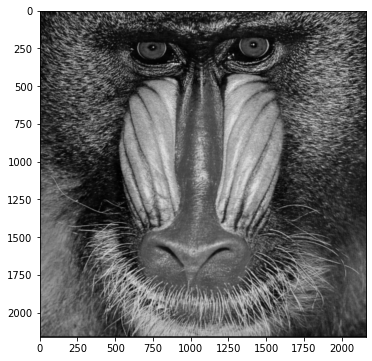

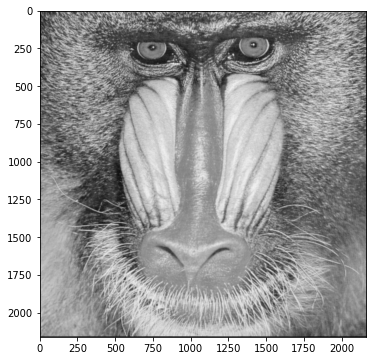

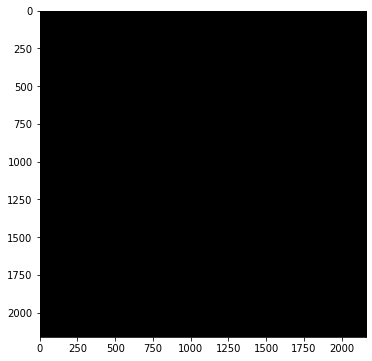

PSNR:  8.830738416114363
tf.Tensor(0.06544796730894717, shape=(), dtype=float64)


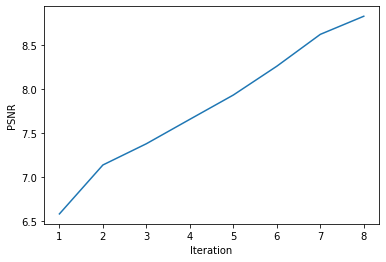

8


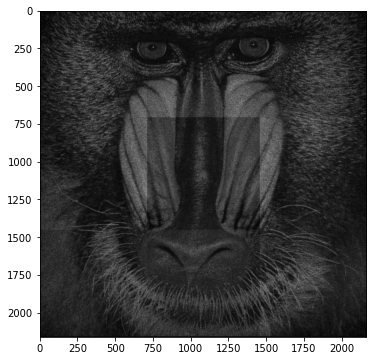

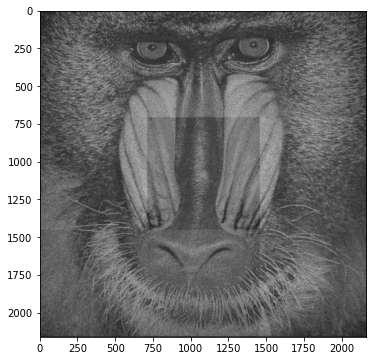

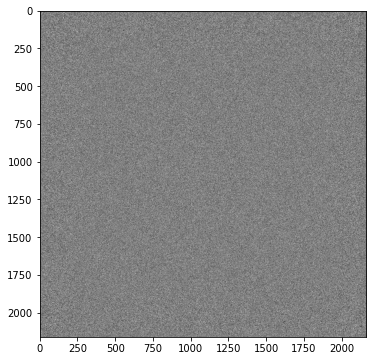

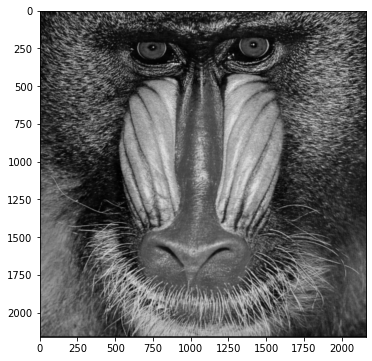

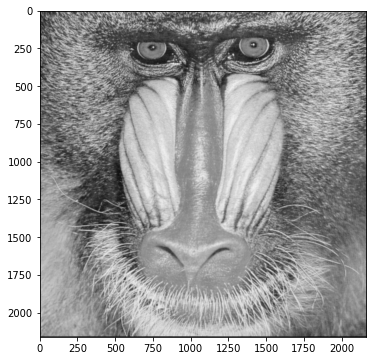

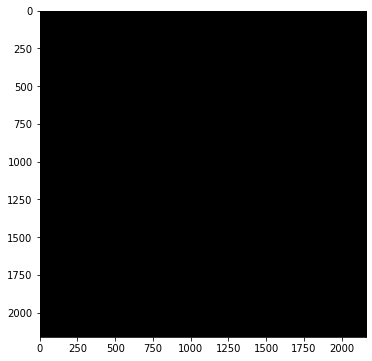

PSNR:  9.06956662120687
tf.Tensor(0.06194601055814263, shape=(), dtype=float64)


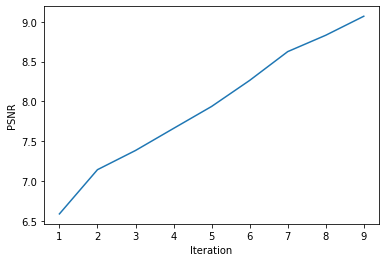

9


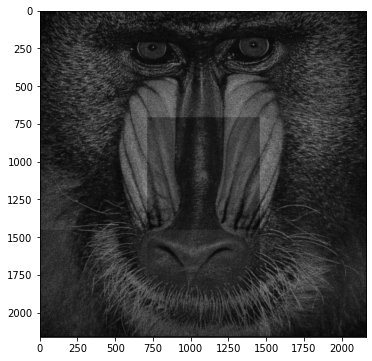

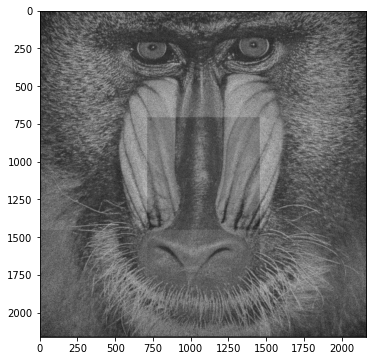

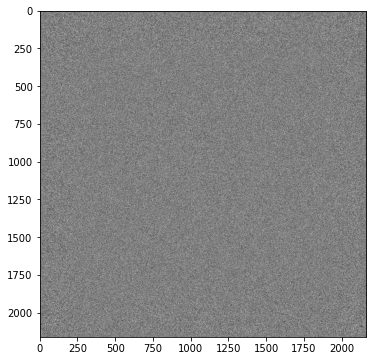

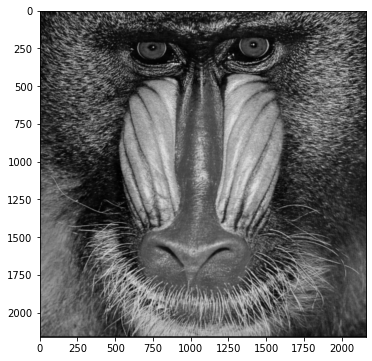

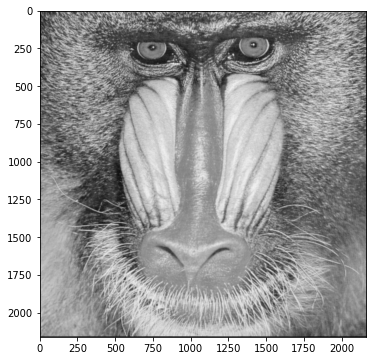

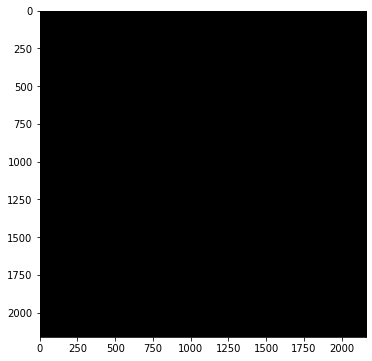

PSNR:  9.24263908218875
tf.Tensor(0.059525917227319876, shape=(), dtype=float64)


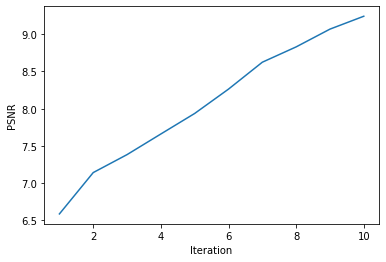

10


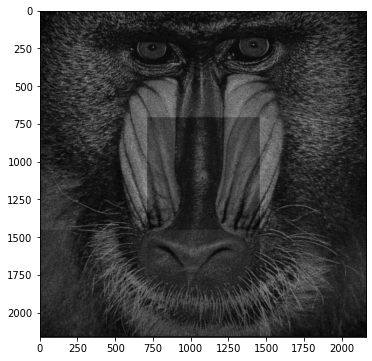

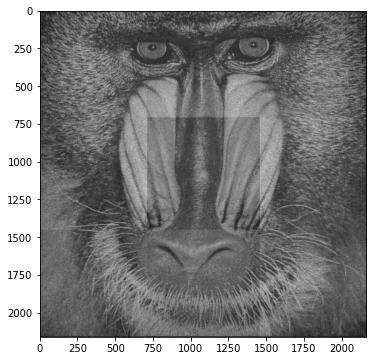

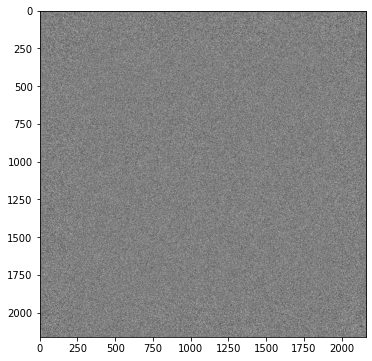

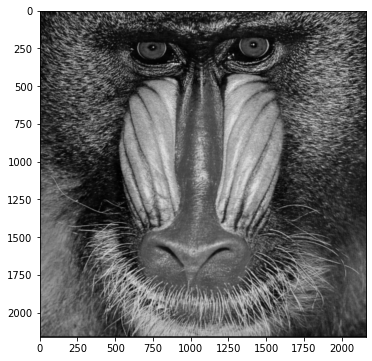

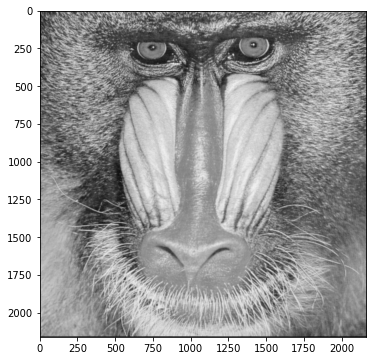

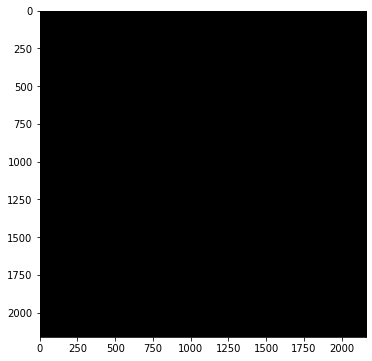

PSNR:  9.52778747119417
tf.Tensor(0.05574311797821963, shape=(), dtype=float64)


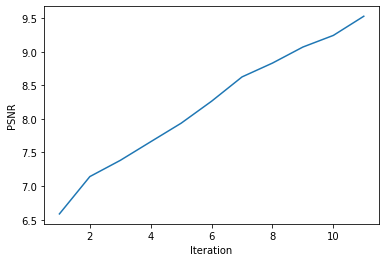

11


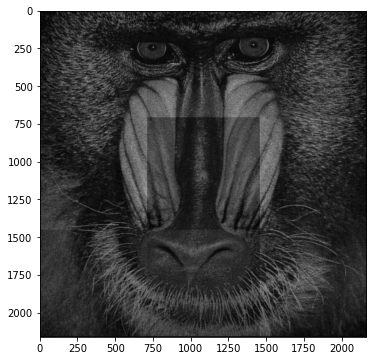

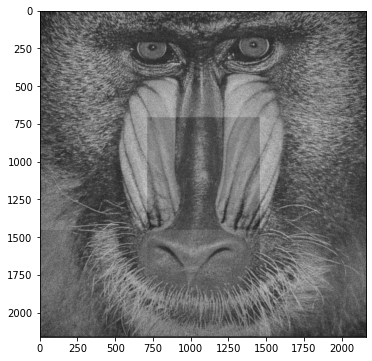

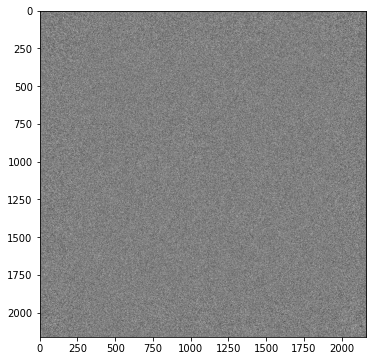

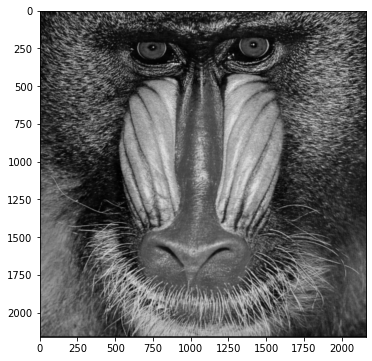

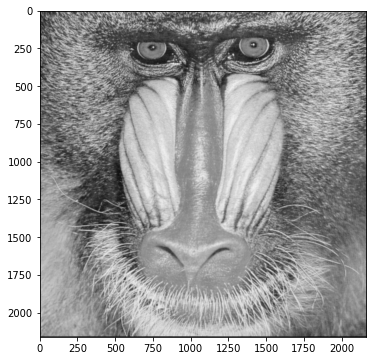

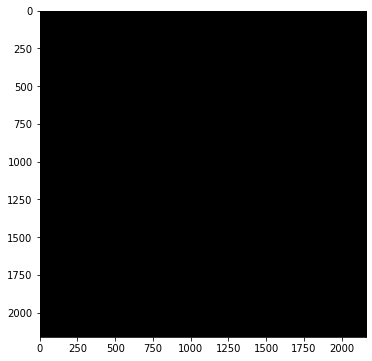

PSNR:  9.6938442196927
tf.Tensor(0.05365195879395356, shape=(), dtype=float64)


KeyboardInterrupt: ignored

In [ ]:
# opt = tf.keras.optimizers.Adam(learning_rate=1.0)
opt = tf.keras.optimizers.Adam(learning_rate=0.1)

list_PSNR =[]
list_iter =[]

def loss_func():
    # phase: なんでもあり(定義域がない)の値, phase_exp: 複素振幅の形に, np.exp(phase)
    phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))
    

    # Input Complex Amplitude: SLMに光があたった状態（light_img: amplitude, A exp(iφ), exp(iφ): phase_exp）
    init_plane = tf.math.multiply(light_img, phase_exp)

    # Propagation from SLM to Image Plane with normalization
    init_plane_add = tf_CGH.add_zero_padding(init_plane)
    N = init_plane_add.shape[0]
    prop = tf_CGH.band_limited_angular_spectrum(init_plane_add, k, N, l_ambda, z, p)
#     prop = tf_CGH.angular_spectrum(init_plane_add, k, N, l_ambda, z, p)
#     prop = tf_CGH.normalize_amp_one(prop)
    prop_rm = tf_CGH.remove_zero_padding(prop)
    N = prop_rm.shape[0]

    '''
    # 1. prop_rmをレンズで変換します

    # 2. レンズで変換した直後の面から，再度伝播します

    # 3. 伝播結果を比較します


    '''
    ### 収差ありレンズ変換
    u_minus = prop_rm
    lens = CGH.response(N, l_ambda, -1.0*lens_f, p)
    #u_plus = u_minus * lens * P_xy
    u_plus = u_minus * lens * p_xy
    
    ###レンズからimageplaneまで伝搬計算
    u_plus_add = tf_CGH.add_zero_padding(u_plus)
    N = init_plane_add.shape[0]
    image_plane = tf_CGH.band_limited_angular_spectrum(u_plus_add, k, N, l_ambda, z, p)
    image_plane_rm = tf_CGH.remove_zero_padding(image_plane)
    N = image_plane_rm.shape[0]

    ### Show Images(強度、振幅、位相)
    
    imgs = [
        CGH.amp_abs(CGH.intensity(image_plane_rm.numpy())),
        CGH.amp_abs(CGH.amplitude(image_plane_rm.numpy())),
        CGH.phase_norm(CGH.phase(image_plane_rm.numpy())),

        CGH.amp_abs(CGH.intensity(goal_img_tf.numpy())),
        CGH.amp_abs(CGH.amplitude(goal_img_tf.numpy())),
        CGH.phase_norm(CGH.phase(goal_img_tf.numpy())),
    ]
    ImageProcess.show_imgs(imgs)


    
    # Calculate Loss
    prop_inten = image_plane_rm * tf.math.conj(image_plane_rm)
    prop_inten = tf.dtypes.cast(prop_inten, tf.float64)
    prop_inten_norm = tf_CGH.normalize_amp_one(prop_inten)

    # PSNR value
    psnr_val = cv2.PSNR(prop_inten_norm.numpy(), target.numpy(), R=1)
    list_PSNR.append(psnr_val)
    print('PSNR: ', psnr_val)

    # target: これもintensity, それを二乗誤差で扱う
    err = prop_inten_norm - target
    loss = 1/2 * ( err ** 2 )
    print(tf.reduce_mean(loss))
    
    return loss


for i in range(100):
    step_count = opt.minimize(loss_func, [phase]).numpy()
    list_iter.append(step_count)

    plt.plot(list_iter, list_PSNR)
    plt.xlabel('Iteration')
    plt.ylabel('PSNR')
    plt.show()
    print(step_count)

In [ ]:
#save image
phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))
init_plane = tf.math.multiply(light_img, phase_exp)
phase_img = CGH.phase_norm(CGH.phase(init_plane.numpy()))
out_dir = 'drive/My Drive/Colab Notebooks/output/'
phase_img.min()
cv2.imwrite(out_dir + 'experiment3-1_phase.png', phase_img)

True

PSNR:  6.4482473048896995


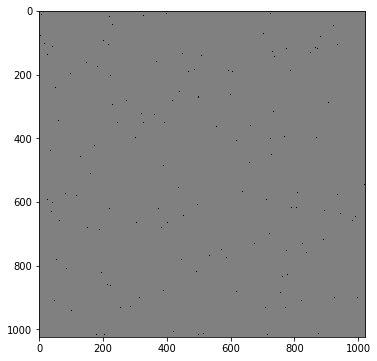

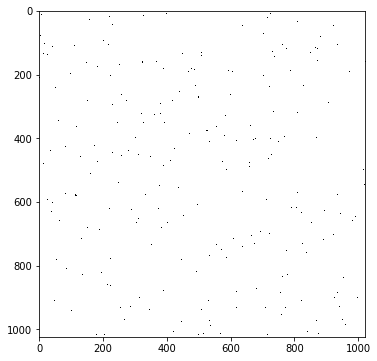

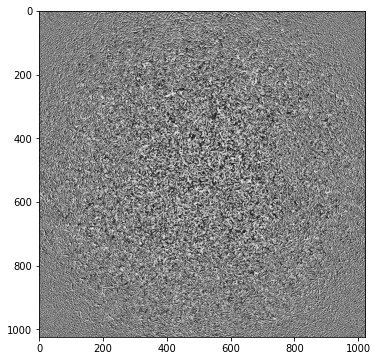

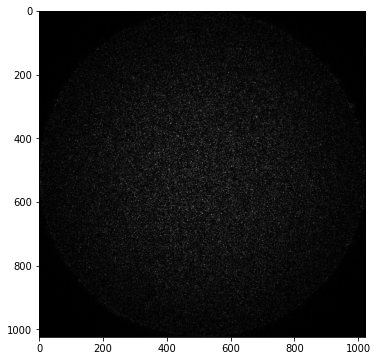

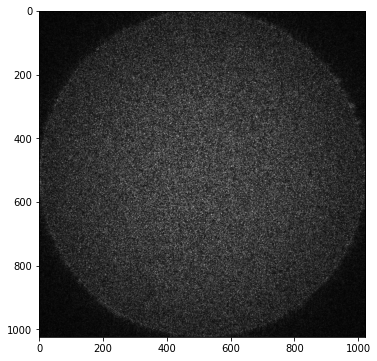

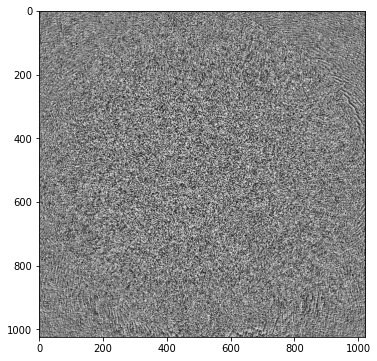

In [ ]:
##### Validate Optimization Result #####
# Input Image
phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))
input_plane = tf.math.multiply(light_img, phase_exp)
input_plane = input_plane.numpy()


# Propagation from SLM to Image Plane
input_plane_add = ImageProcess.add_zero_padding(input_plane)
N = input_plane_add.shape[0]
# recon_img = CGH.propagation(input_plane_add, N, l_ambda, z, p)
recon_img = CGH.band_limited_angular_spectrum(input_plane_add, N, l_ambda, z, p)
# recon_img = CGH.angular_spectrum(input_plane_add, N, l_ambda, z, p)
recon_img = ImageProcess.remove_zero_padding(recon_img)
N = recon_img.shape[0]


# PSNR value
recon_img_inten = ImageProcess.normalize_amp_one(CGH.intensity(recon_img))
psnr_val = cv2.PSNR(recon_img_inten, target.numpy(), R=1)
print('PSNR: ', psnr_val)


##### Check Images #####
imgs = [
        CGH.amp_abs(CGH.intensity(input_plane)),
        CGH.amp_abs(CGH.amplitude(input_plane)),
        CGH.phase_norm(CGH.phase(input_plane)),

        CGH.amp_abs(CGH.intensity(recon_img)),
        CGH.amp_abs(CGH.amplitude(recon_img)),
        CGH.phase_norm(CGH.phase(recon_img))

    ]
ImageProcess.show_imgs(imgs)
opt_out_path = out_path + 'opt_'
ImageProcess.save_imgs(opt_out_path, imgs)

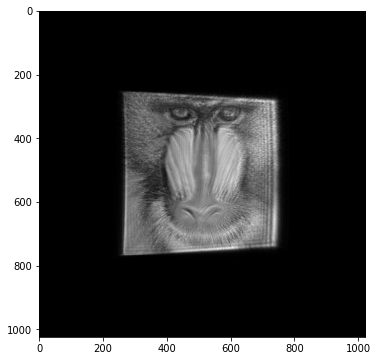

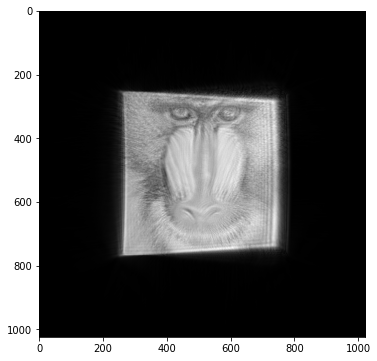

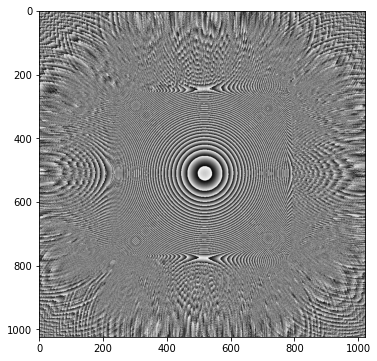

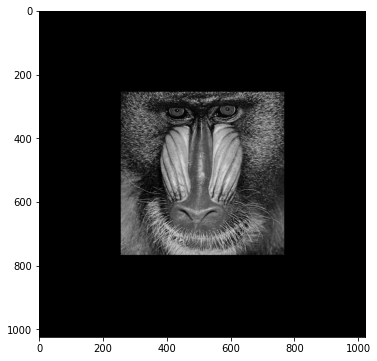

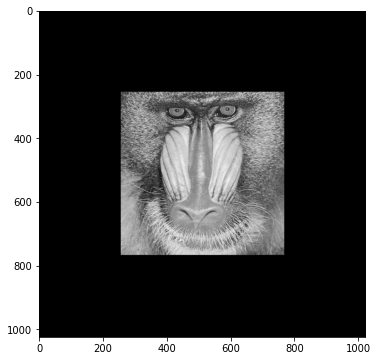

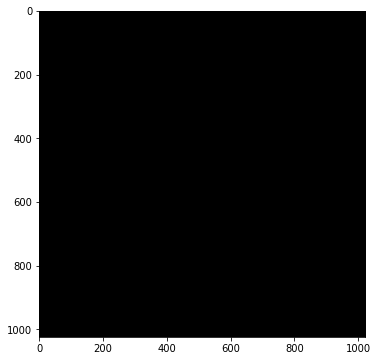

20.10092663476673


In [ ]:
# phase: なんでもあり(定義域がない)の値, phase_exp: 複素振幅の形に, np.exp(phase)
phase = np.zeros(size)
phase = tf.constant(phase)

phase_exp = tf.dtypes.complex(tf.math.cos(phase), tf.math.sin(phase))


# Input Complex Amplitude: source_img: amplitude, A exp(iφ), exp(iφ): phase_exp）
init_plane = tf.math.multiply(source_img, phase_exp)

# Propagation from SLM to Image Plane with normalization
init_plane_add = tf_CGH.add_zero_padding(init_plane)
N = init_plane_add.shape[0]
prop = tf_CGH.band_limited_angular_spectrum(init_plane_add, k, N, l_ambda, z, p)
prop_rm = tf_CGH.remove_zero_padding(prop)
N = prop_rm.shape[0]

'''
# 1. prop_rmをレンズで変換します

# 2. レンズで変換した直後の面から，再度伝播します

# 3. 伝播結果を比較します


'''
### 収差なしレンズ変換
u_minus = prop_rm
lens = CGH.response(N, l_ambda, -1.0*lens_f, p)
u_plus = u_minus * lens * P_xy


###レンズからimageplaneまで伝搬計算
u_plus_add = tf_CGH.add_zero_padding(u_plus)
N = init_plane_add.shape[0]
image_plane = tf_CGH.band_limited_angular_spectrum(u_plus_add, k, N, l_ambda, z, p)
image_plane_rm = tf_CGH.remove_zero_padding(image_plane)
N = image_plane_rm.shape[0]

### Show Images(強度、振幅、位相)

imgs = [
    CGH.amp_abs(CGH.intensity(image_plane_rm.numpy())),
    CGH.amp_abs(CGH.amplitude(image_plane_rm.numpy())),
    CGH.phase_norm(CGH.phase(image_plane_rm.numpy())),

    CGH.amp_abs(CGH.intensity(goal_img_tf.numpy())),
    CGH.amp_abs(CGH.amplitude(goal_img_tf.numpy())),
    CGH.phase_norm(CGH.phase(goal_img_tf.numpy())),
]
for i in range(3):
  imgs[i] = cv2.flip(imgs[i], -1) 
ImageProcess.show_imgs(imgs)

out_dir = 'drive/My Drive/Colab Notebooks/output/'

#cv2.imwrite(out_dir+'target.png', imgs[0])
print(cv2.PSNR(amp_img_np, imgs[0]/imgs[0].max(), R=1))




